# Geographic Coordinate Systems

## Geographic Latitude and Longitude

![](./support/latlon.png)

Locations on Earth are typically expressed in latitude and longitude:

* Latitude
  * Starts at equator
  * North Pole is 90 degrees North
  * South Pole is 90 degrees South
* Longitude
  * Starts at prime meridian (through London)
  * Continues +/- 180 degrees East and West to international date line
  
Interesting aisde: 1 nautical mile was originally defined as the distance in 1 minute of latitude (1/60 degree of latitude).

Lat and Long can be expressed in:
* Degrees, Minutes, Seconds (34°34'32.5"N 86°33'40.7"W)
* Decimal Degrees (34.575683, -86.561300)
* Occasionally radians?
  
  
## Geodetic Datum
From [Wikipedia](https://en.wikipedia.org/wiki/Geodetic_datum#Definition): 

In surveying and geodesy, a datum is a reference system or an approximation of the Earth's surface against which positional measurements are made for computing locations. Horizontal datums are used for describing a point on the Earth's surface, in latitude and longitude or another coordinate system. Vertical datums are used to measure elevations or underwater depths.


### Horizontal Datum

The horizontal datum is the model used to measure positions on the Earth. A specific point on the Earth can have substantially different coordinates, depending on the datum used to make the measurement. There are hundreds of local horizontal datums around the world, usually referenced to some convenient local reference point. Contemporary datums, based on increasingly accurate measurements of the shape of the Earth, are intended to cover larger areas. The WGS 84 datum, which is almost identical to the NAD83 datum used in North America and the ETRS89 datum used in Europe, is a common standard datum.


### Vertical Datum

A vertical datum is used as a reference point for elevations of surfaces and features on the Earth including terrain, bathymetry, water levels, and man-made structures. Vertical datums are either: tidal, based on sea levels; gravimetric, based on a geoid; or geodetic, based on the same ellipsoid models of the Earth used for computing horizontal datums.

![](./support/geo.jpg)

## Other Coordinates and Data

### [UTM](https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system) and [MGRS](https://en.wikipedia.org/wiki/Military_Grid_Reference_System)

Universal Transverse Mercator and Military Grid Reference System

Divides earth into 6 zones, each 6 deg of longitude in width. Each zone has a transverse Mercator projection that maps a north-south region with less than 1 part in 1000 distortion.

Typically a zone number as well as a 'northing' and 'easting' in that zone eg, `17N 630084 4833438`

### [State Plane](https://en.wikipedia.org/wiki/State_Plane_Coordinate_System)

The system is widely used for geographic data by state and local governments. Its popularity is due to at least two factors. First, it uses a simple Cartesian coordinate system to specify locations rather than a more complex spherical coordinate system (the geographic coordinate system of latitude and longitude). By using the Cartesian coordinate system's simple XY coordinates, "plane surveying" methods can be used, speeding up and simplifying calculations. Second, the system is highly accurate within each zone (error less than 1:10,000). Outside a specific state plane zone accuracy rapidly declines, thus the system is not useful for regional or national mapping.

### Cartesian Coordinates

#### [Earth Centered, Earth Fixed](https://en.wikipedia.org/wiki/ECEF)

A right-handed coordinate system defined by:

* The origin at the center of mass of the Earth, a point close to the Earth's center of figure
* The Z axis on the line between the North and South Poles, with positive values increasing northward (but does not exactly coincide with the Earth's rotational axis)[13]
* The X and Y axes in the plane of the Equator
* The X axis passing through extending from 180 degrees longitude at the Equator (negative) to 0 degrees longitude (prime meridian) at the Equator (positive)
* The Y axis passing through extending from 90 degrees west longitude at the Equator (negative) to 90 degrees east longitude at the Equator (positive)

#### [ENU/NED](https://en.wikipedia.org/wiki/Axes_conventions)

Local tangent plane coordinates.  Depending on the application, XYZ will map either to East-North-Up (rockets and things looking up) or North-East-Down (airplanes and things looking down).

These are pretty convenient if you are working in a relatively confined area.  I would suggest using some of the transforms found in the `NavPy`package: https://navpy.readthedocs.io/en/latest/code_docs/coordinate_transformations.html

#### [Earth-centered intertial](https://en.wikipedia.org/wiki/Earth-centered_inertial)

Origin at center of mass, but do not rotate with respect to the stars.

In [1]:
%matplotlib nbagg

In [2]:
import numpy as np
from PIL import Image
import matplotlib.pylab as pylab

In [3]:
lla = np.array((34.575833, -86.563183, 484.6 * .3048))
lla

#lla = np.array((34.575683, -86.561300, 461 * .3048))
#lla

array([ 34.575833, -86.563183, 147.70608 ])

4320 2161


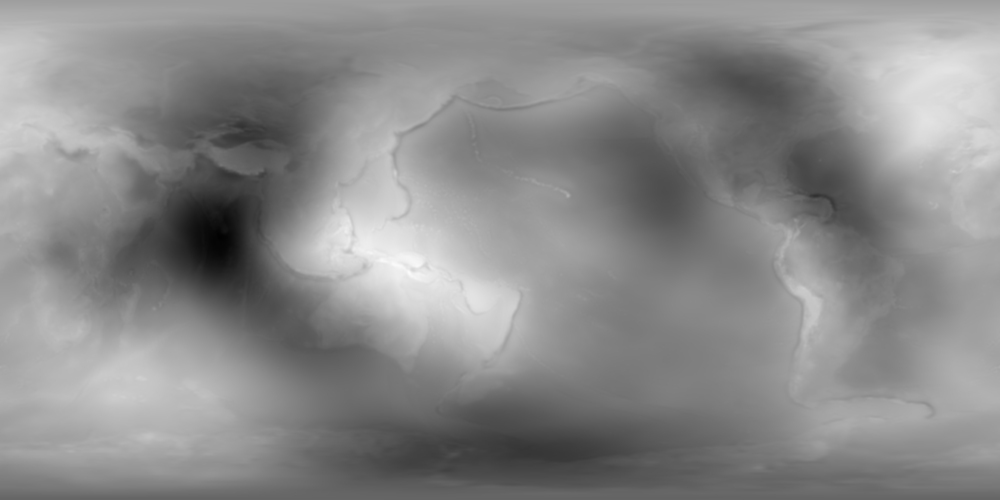

In [4]:
im = Image.open('./support/geoids/egm96-5.pgm')
print(im.width, im.height)
im

In [9]:
import geoid
gh = geoid.GeoidHeight(name="./support/geoids/egm96-5.pgm")


2161

dataset.indexes (1,)
band1.shape (3601, 3601)


<IPython.core.display.Javascript object>


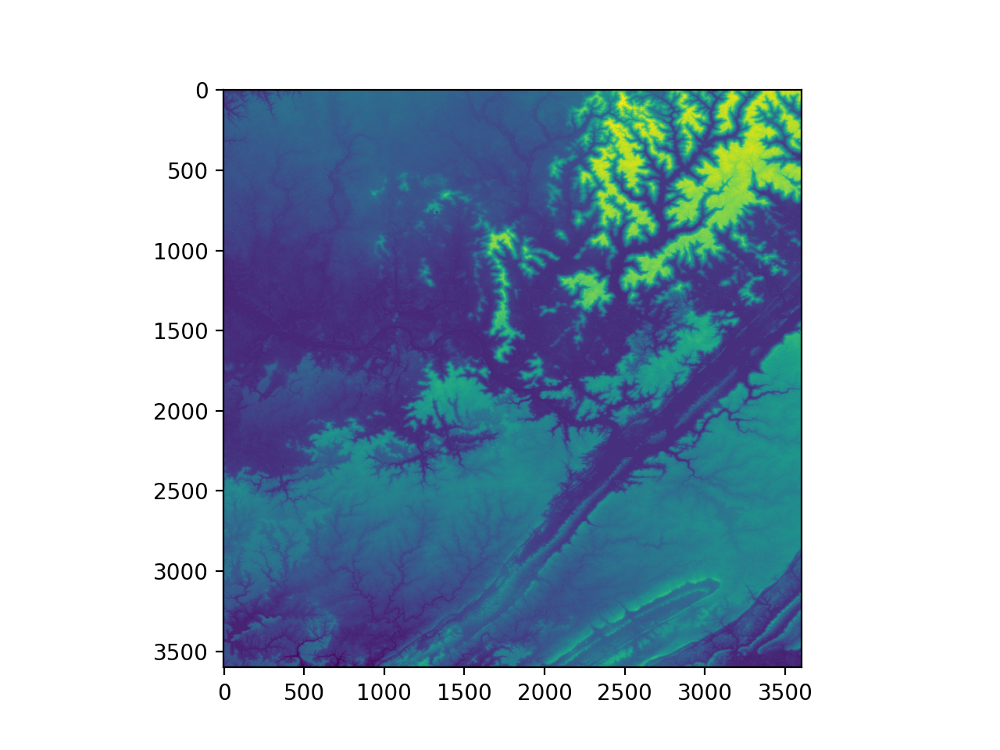

In [10]:
# Working with elevation data: SRTM https://lta.cr.usgs.gov/SRTM
# USGS EarthExplorer: http://earthexplorer.usgs.gov/

import rasterio

dataset = rasterio.open('./support/n34_w087_1arc_v3.dt2')
print('dataset.indexes', dataset.indexes)

band1 = dataset.read(1)
print('band1.shape', band1.shape)

pylab.figure()
pylab.imshow(band1)

<IPython.core.display.Javascript object>


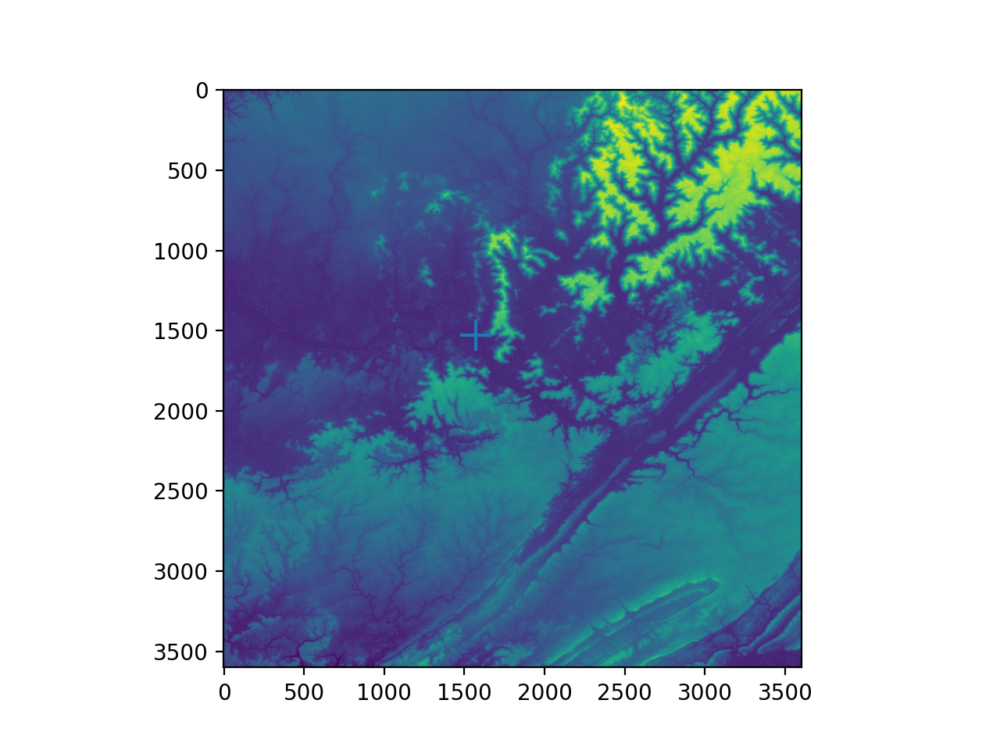

In [11]:
pixel_x = (lla[1] - dataset.affine[2]) / dataset.affine[0]
pixel_y = (lla[0] - dataset.affine[5]) / dataset.affine[4]

pylab.figure()
pylab.imshow(band1)
pylab.scatter(pixel_x,pixel_y,marker='+',s=200)

In [12]:
print(dataset.affine)

pixel_x = (lla[1] - dataset.affine[2]) / dataset.affine[0]
pixel_y = (lla[0] - dataset.affine[5]) / dataset.affine[4]

pixel_xx = int(pixel_x)
pixel_yy = int(pixel_y)

print()
print(pixel_x, pixel_y)
print(pixel_xx, pixel_yy)

| 0.00, 0.00,-87.00|
| 0.00,-0.00, 35.00|
| 0.00, 0.00, 1.00|

1573.0412000000001 1527.501199999972
1573 1527


<IPython.core.display.Javascript object>


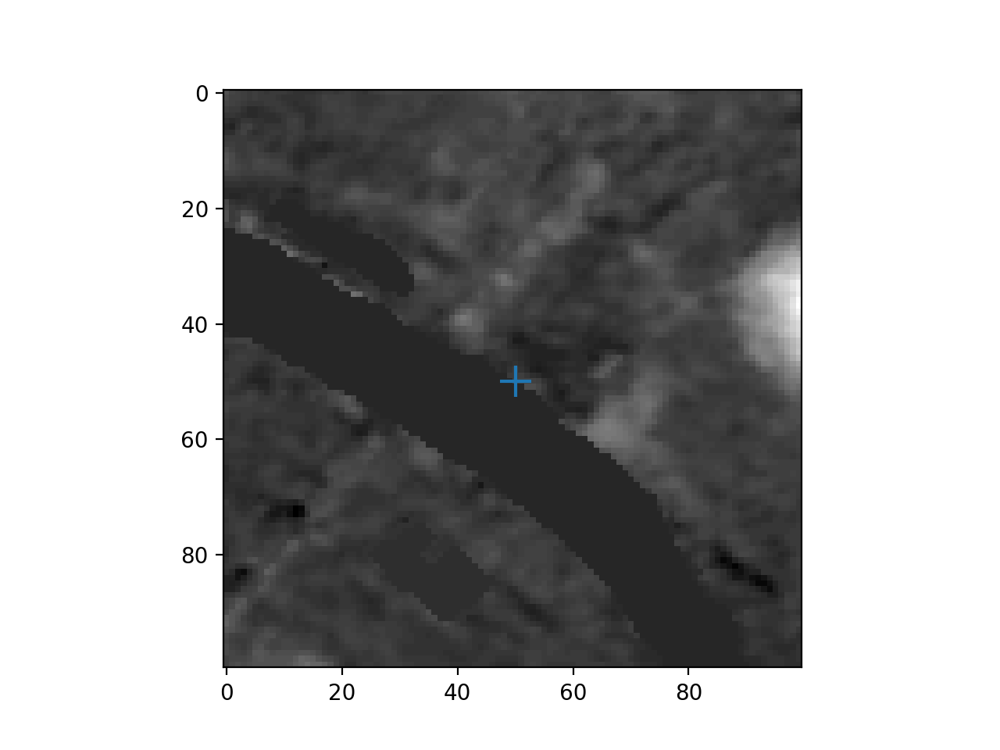

In [13]:
pylab.figure()
pylab.imshow(band1[pixel_yy-50:pixel_yy+50,pixel_xx-50:pixel_xx+50], cmap='gray')
pylab.scatter(50,50,marker='+',s=200)

In [14]:
def interp(pix_x, pix_y, grid):
    x = int(pix_x)
    y = int(pix_y)
    
    dx = pix_x - x 
    dy = pix_y - y
    
    f00 = grid[x + 0, y + 0]
    f10 = grid[x + 1, y + 0]
    f01 = grid[x + 0, y + 1]
    f11 = grid[x + 1, y + 1]
    
    return (f00 * (1 - dx) * (1 - dy) +
            f10 * dx * (1 - dy) +
            f01 * (1 - dx) * dy +
            f11 * dx * dy)

srtm_height = interp(pixel_y, pixel_x, band1)
egm_height = gh.get(lla[0], lla[1])

print("Computed Height (m): ", srtm_height + egm_height)

Computed Height (m):  140.3391994581183


In [15]:
ditto = band1[pixel_yy-30:pixel_yy+30,pixel_xx-30:pixel_xx+30]

In [ ]:
x, y = np.meshgrid(range(ditto.shape[0]), range(ditto.shape[1]))

In [ ]:
from mpl_toolkits.mplot3d.axes3d import *

fig = pylab.figure()
ax = Axes3D(fig)
ax.plot_surface(x, y, ditto, rstride=1, cmap=pylab.cm.jet, cstride=1,linewidth=1, antialiased=True)